### MAIN MODEL BUILD/RUN

#### This script is to build the Yolo Model to replicate the structure utilize for CholectT50 procedure in classifying instruments, phases, and sections. By employing YOLO, we require to have three things:
1) Yaml File containing paths to train/test/validate
2) Labels in COCO/YOLO Format
3) Pretained Model to hyperparameter tune

#### We will go over each kernel to explain the steps

### STEPS:

#### 1) Import Necessary Packages
#### 2) Model Import/Preparation
#### 3) Model Hyperparameter Tune Run
#### 4) Retrieve Results/Winning Hyperparameters
#### 5) Review Scoring/Possible Improvements
#### 6) Test Model

##### IMPORTANT: TO RUN THIS SCRIPT DO THE FOLLOWING:

1) Create conda environment as follows :
    - conda create -n ECE579Proj python=3.10    
    * (Python 3.10 is compatible with all packages in requirements.txt and torch version)
1) Run the command : 
    - pip install torch torchvision --index-url https://download.pytorch.org/whl/cu129 
    * (VERIFY YOUR GPU DEVICE WITH 'nvidia-smi' TO SELECT CORRECT CUDA VERSION)
2) Run the following command: 
    - pip install -r requirements.txt

# -------------------------------------------------------------------------------------------

#### 1) Import Necessary Packages

In [1]:
### Import packages for working with Model Requisites

from IPython.display import display
from PIL import Image
import matplotlib.pyplot as plt
from ultralytics import YOLO
import matplotlib.image as mpimg
import pandas as pd
import numpy as np
import torch

#### 2) Model Import / Preparation

In [2]:
### Import an instance of YOLO Model, in this case we will utilize the new updated version, for October 2025,
### titled YOLOv12

model = YOLO('yolo11n-cls.pt')

In [3]:
### To showcase how the data connects with Computer Vision modelssuch as YOLO
### We will illustrate the structure of the YAML file as follows

'''
------> Standard data.yaml file structure <------

path: .../datafolder
train: .../datafolder/images/train
val: .../datafolder/images/val
test: .../datafolder/images/test

nc: n      #-> Where n is any number of classes to utilize for train/val/test
names: 
    0: 'car'
    1: 'plane'
    2: .....

    #-> Where the classes are assigned numerical values to pair up with

'''

"\n------> Standard data.yaml file structure <------\n\npath: .../datafolder\ntrain: .../datafolder/images/train\nval: .../datafolder/images/val\ntest: .../datafolder/images/test\n\nnc: n      #-> Where n is any number of classes to utilize for train/val/test\nnames: \n    0: 'car'\n    1: 'plane'\n    2: .....\n\n    #-> Where the classes are assigned numerical values to pair up with\n\n"

In [4]:
### The data isnt imported per se directly via any module, rather by YAML file to use in YOLO Model
### So we would not utilize:

#pd.read_csv

#glob....

### Or any version of those.

#### 3) Model Hyperparameter Tune Run

In [5]:
### Lets set for the hyperparameters we which to tune
### This will iteratively run the model with different "settings" to view which is the best fitted model

hyperparameters = {
    "batch": 16,
    "imgsz": 512,
    "epochs": 50,
    "patience": 20,
    "optimizer": "auto",
    "cos_lr": True,
    "multi_scale": False,
}

### Where the hyperparameters selected mean the following:

#batch = batch size for images
#imgsz = input size of images
#epochs = number of iterations to run
#patience = early stopping parameter
#optimizer = if 'auto' let YOLO select best optimizer
#cos_lr = cosine learning rate
#multi_scale = Robustness parameter

In [6]:
### Lets verify if the GPU device is available to select
### And showcase its index to use in our model
print("torch.cuda.is_available():", torch.cuda.is_available())

### Show the deviece name and index
if torch.cuda.is_available():
    print("current device index:", torch.cuda.current_device())
    print("current device name:", torch.cuda.get_device_name(torch.cuda.current_device()))

torch.cuda.is_available(): False


In [7]:
### With our hyperparameters of interest selected, we can build our hyperparameter run to iterate and find the optimal model

model_result = model.train(
    data='./YOLO_dataset',
    device="cpu",
    **hyperparameters
)

### Save the tuned model

trainmodel_path = "./MODEL/best_model.pt"
model.save(trainmodel_path)
print(f'Model training finished and stored/saved in : \n{trainmodel_path}')


New https://pypi.org/project/ultralytics/8.3.231 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.213  Python-3.10.18 torch-2.9.1+cpu CPU (Intel Core Ultra 9 275HX)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=./YOLO_dataset, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=Fa

In [8]:
### Setup the second round of hyperparameters for next model

hyperparameters_2 = {
    "batch": 32,           
    "imgsz": 512,          
    "epochs": 80,          
    "patience": 25,        
    "optimizer": "AdamW",  
    "lr0": 1e-3,           
    "weight_decay": 0.01,  
    "cos_lr": True,        
    "multi_scale": False,
    "dropout": 0.1,        
}

In [10]:
### With our hyperparameters of interest selected, we can build our hyperparameter run to iterate and find the optimal model

model = YOLO('yolo11n-cls.pt')

model_result2 = model.train(
    data='./YOLO_dataset',
    device="cpu",
    **hyperparameters_2
)

### Save the tuned model

trainmodel_path2 = "./MODEL/best_model_2.pt"
model.save(trainmodel_path2)
print(f'Model training finished and stored/saved in : \n{trainmodel_path2}')


New https://pypi.org/project/ultralytics/8.3.231 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.213  Python-3.10.18 torch-2.9.1+cpu CPU (Intel Core Ultra 9 275HX)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=./YOLO_dataset, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.1, dynamic=False, embed=None, epochs=80, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=

In [11]:
### Setup the third round of hyperparameters for next model

hyperparameters_3 = {
    "batch": 8,              
    "imgsz": 640,            
    "epochs": 25,           
    "patience": 40,          
    "optimizer": "SGD",      
    "lr0": 0.01,             
    "momentum": 0.937,       
    "weight_decay": 0.0005,  
    "cos_lr": True,
    "multi_scale": True,     
    "label_smoothing": 0.1,  
}

In [12]:
### With our hyperparameters of interest selected, we can build our hyperparameter run to iterate and find the optimal model

model = YOLO('yolo11n-cls.pt')

model_result3 = model.train(
    data='./YOLO_dataset',
    device="cpu",
    **hyperparameters_3
)

### Save the tuned model

trainmodel_path3 = "./MODEL/best_model_3.pt"
model.save(trainmodel_path3)
print(f'Model training finished and stored/saved in : \n{trainmodel_path3}')


New https://pypi.org/project/ultralytics/8.3.231 available  Update with 'pip install -U ultralytics'
WARNING 'label_smoothing' is deprecated and will be removed in the future.
Ultralytics 8.3.213  Python-3.10.18 torch-2.9.1+cpu CPU (Intel Core Ultra 9 275HX)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=./YOLO_dataset, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-cls.pt, momentum=0.937, mosaic=1.0,

#### 4) Retrieve Results/Winning Hyperparameters

In [13]:
### We will retrieve/load our model to perform validation to verify if the content satisfies classification with the provided classes of cleansed data
### This is for best model 1

model_new1 = YOLO("./MODEL/best_model.pt")

print(model_new1.args)


{'task': 'classify', 'data': './YOLO_dataset', 'imgsz': 512, 'single_cls': False, 'model': './MODEL/best_model.pt'}


In [ ]:
### Illustrate the results in dataframe for its basic statistics description

results_model1 = pd.read_csv("runs/classify/train/results.csv")
results_model1.describe()



,epoch,time,train/loss,metrics/accuracy_top1,metrics/accuracy_top5,val/loss,lr/pg0,lr/pg1,lr/pg2
count,50.00000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000
mean,25.50000,5007.649260,0.280148,0.952623,0.988689,0.163105,0.000118,0.000118,0.000118
std,14.57738,2868.970122,0.424482,0.100608,0.042674,0.367016,0.000081,0.000081,0.000081
min,1.00000,169.015000,0.059110,0.447220,0.730280,0.007790,0.000003,0.000003,0.000003
25%,13.25000,2633.202500,0.077195,0.959835,0.998985,0.010375,0.000041,0.000041,0.000041
50%,25.50000,4970.290000,0.128835,0.992750,1.000000,0.027840,0.000116,0.000116,0.000116
75%,37.75000,7424.555000,0.279183,0.996520,1.000000,0.117553,0.000194,0.000194,0.000194
max,50.00000,9942.090000,2.560870,0.997680,1.000000,2.079700,0.000237,0.000237,0.000237


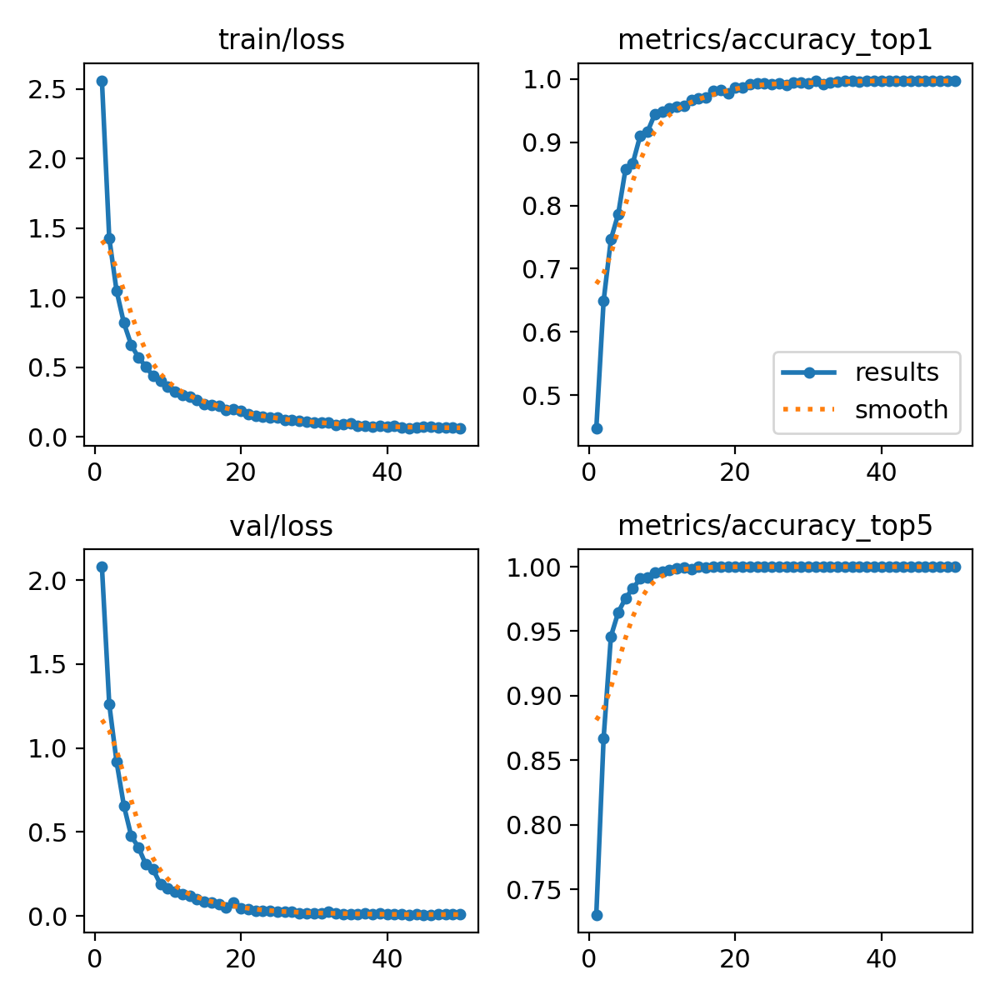

In [ ]:
### Showcase the results image for metrics, train/loss and val/loss

img = Image.open("runs/classify/train/results.png")
display(img)

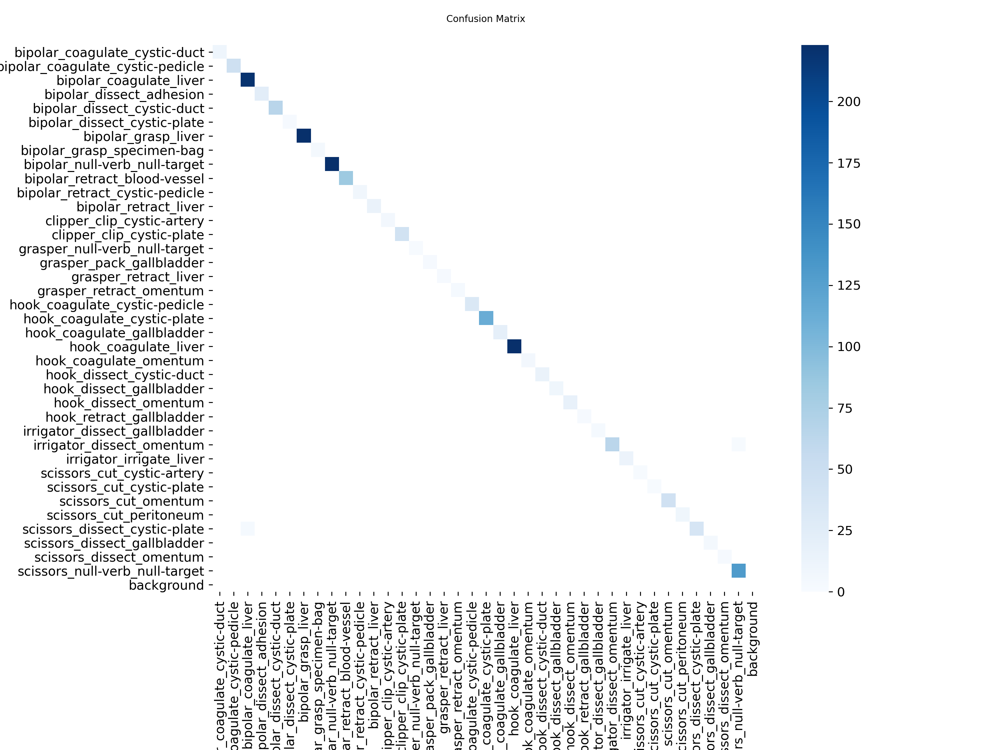

In [ ]:
### Showcase the confusion matrix for the classification model

img = Image.open("runs/classify/train/confusion_matrix.png")
display(img)

In [16]:
### We will retrieve/load our model to perform validation to verify if the content satisfies classification with the provided classes of cleansed data
### This is for best model 2

model_new2 = YOLO("./MODEL/best_model_2.pt")

print(model_new2.args)

{'task': 'classify', 'data': './YOLO_dataset', 'imgsz': 512, 'single_cls': False, 'model': './MODEL/best_model_2.pt'}


In [ ]:
### Illustrate the results in dataframe for its basic statistics description

results_model2 = pd.read_csv("runs/classify/train2/results.csv")
results_model2.describe()

,epoch,time,train/loss,metrics/accuracy_top1,metrics/accuracy_top5,val/loss,lr/pg0,lr/pg1,lr/pg2
count,80.0000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000
mean,40.5000,8562.086325,0.232958,0.952016,0.993982,0.166521,0.001760,0.000499,0.000499
std,23.2379,4384.752862,0.294859,0.091274,0.025581,0.381630,0.008336,0.000344,0.000344
min,1.0000,201.386000,0.027550,0.470420,0.802780,0.002110,0.000010,0.000010,0.000010
25%,20.7500,5078.590000,0.059100,0.947075,1.000000,0.006410,0.000165,0.000165,0.000165
50%,40.5000,8763.020000,0.116015,0.991880,1.000000,0.022430,0.000515,0.000495,0.000495
75%,60.2500,12273.175000,0.289578,0.998405,1.000000,0.146330,0.000858,0.000830,0.000830
max,80.0000,15692.000000,1.793770,1.000000,1.000000,2.616550,0.067314,0.000997,0.000997


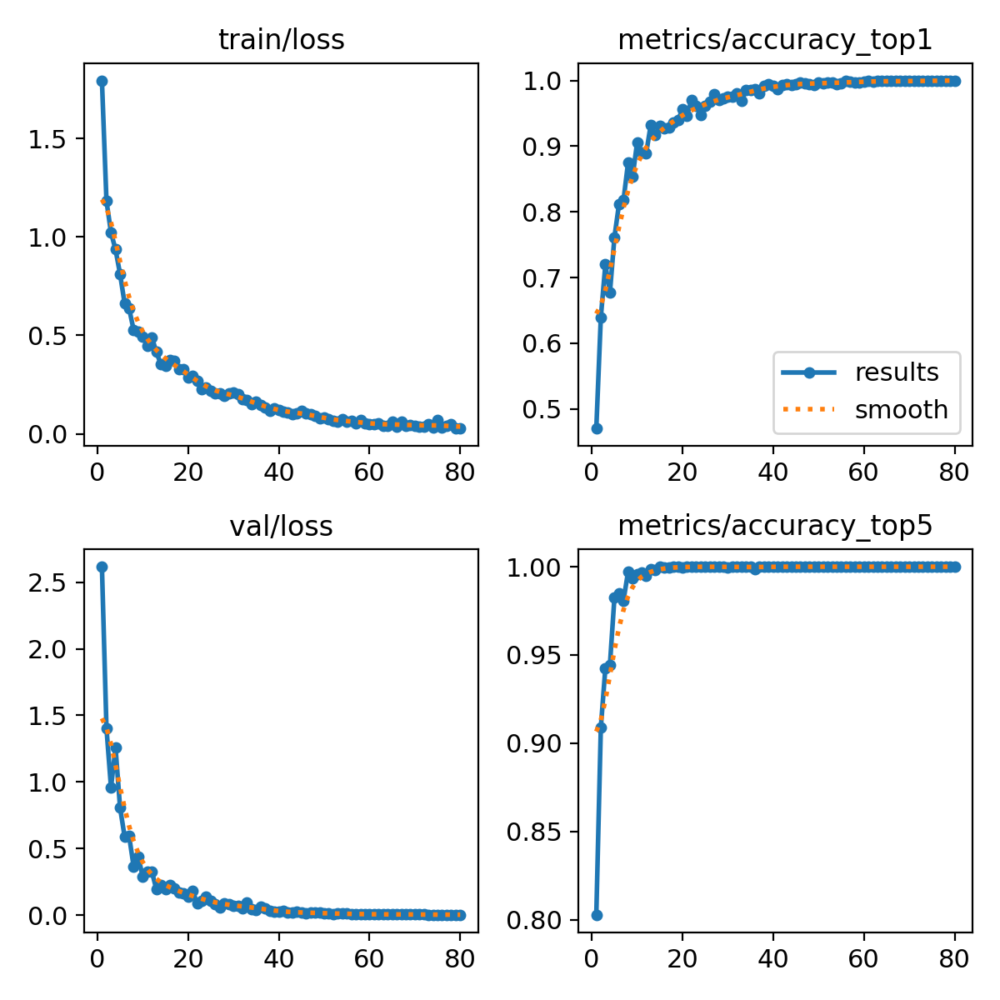

In [ ]:
### Showcase the results image for metrics, train/loss and val/loss

img = Image.open("runs/classify/train2/results.png")
display(img)

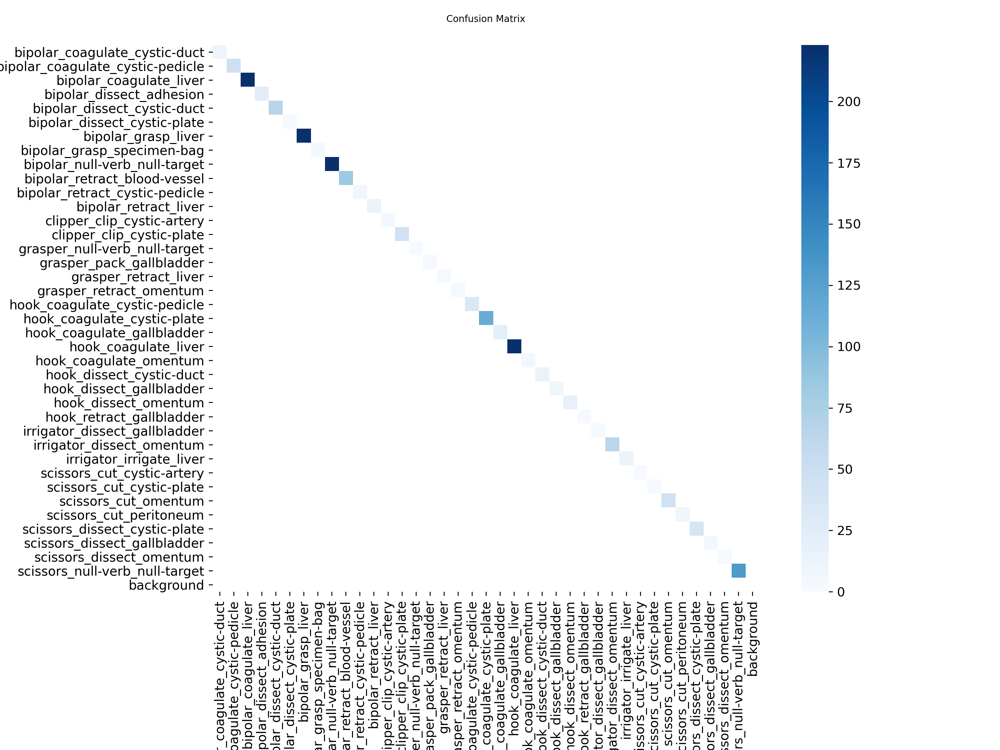

In [ ]:
### Showcase the confusion matrix for the classification model

img = Image.open("runs/classify/train2/confusion_matrix.png")
display(img)

In [19]:
### We will retrieve/load our model to perform validation to verify if the content satisfies classification with the provided classes of cleansed data
### This is for best model 3

model_new3 = YOLO("./MODEL/best_model_3.pt")

print(model_new3.args)

{'task': 'classify', 'data': './YOLO_dataset', 'imgsz': 640, 'single_cls': False, 'model': './MODEL/best_model_3.pt'}


In [ ]:
### Illustrate the results in dataframe for its basic statistics description

results_model3 = pd.read_csv("runs/classify/train3/results.csv")
results_model3.describe()

,epoch,time,train/loss,metrics/accuracy_top1,metrics/accuracy_top5,val/loss,lr/pg0,lr/pg1,lr/pg2
count,25.000000,25.00000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000
mean,13.000000,4005.99020,0.573967,0.883805,0.978841,0.409709,0.008857,0.004848,0.004848
std,7.359801,2466.82143,0.464590,0.116831,0.041493,0.453135,0.014928,0.003304,0.003304
min,1.000000,263.68700,0.113930,0.569030,0.814970,0.033990,0.000139,0.000139,0.000139
25%,7.000000,1987.91000,0.199440,0.806840,0.980860,0.071100,0.001895,0.001895,0.001895
50%,13.000000,3788.39000,0.440370,0.925750,0.995940,0.223490,0.005361,0.004739,0.004739
75%,19.000000,6181.53000,0.797270,0.973320,1.000000,0.600120,0.008658,0.007702,0.007702
max,25.000000,8089.86000,1.994770,0.991300,1.000000,1.773260,0.070072,0.009837,0.009837


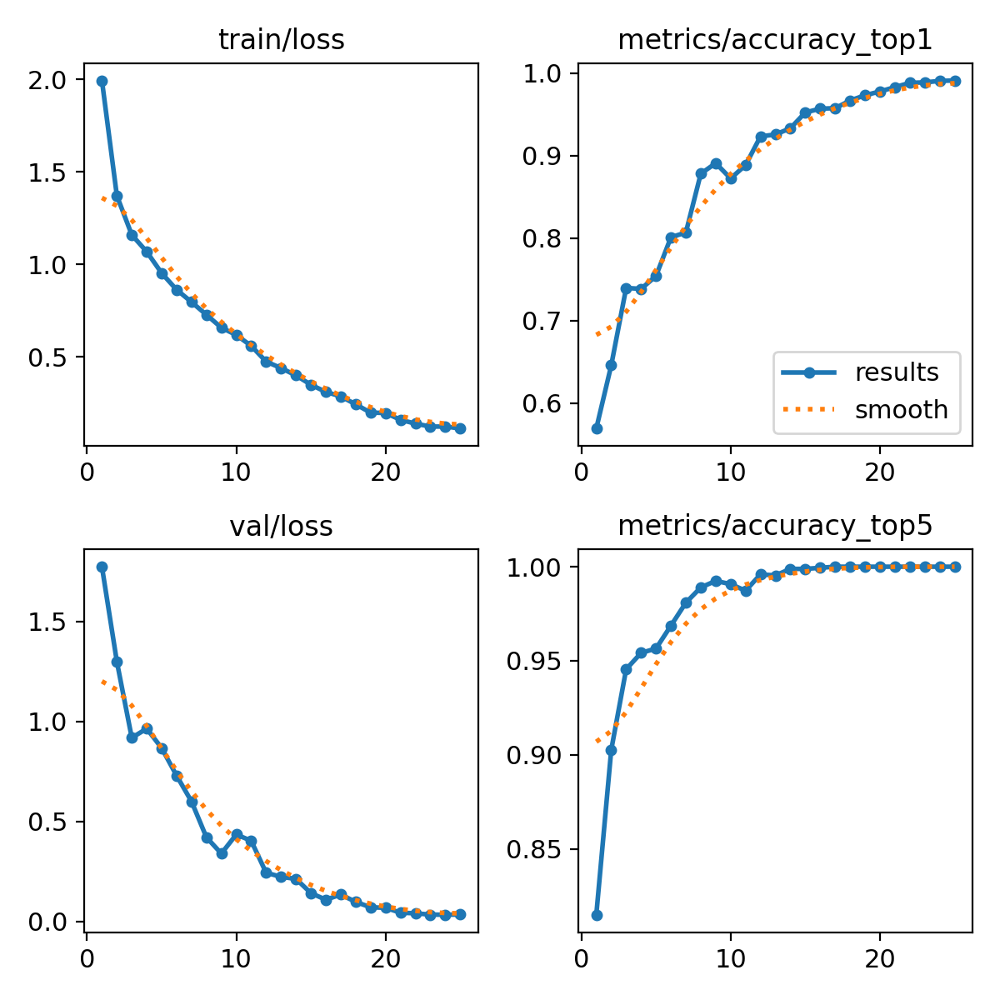

In [ ]:
### Showcase the results image for metrics, train/loss and val/loss

img = Image.open("runs/classify/train3/results.png")
display(img)

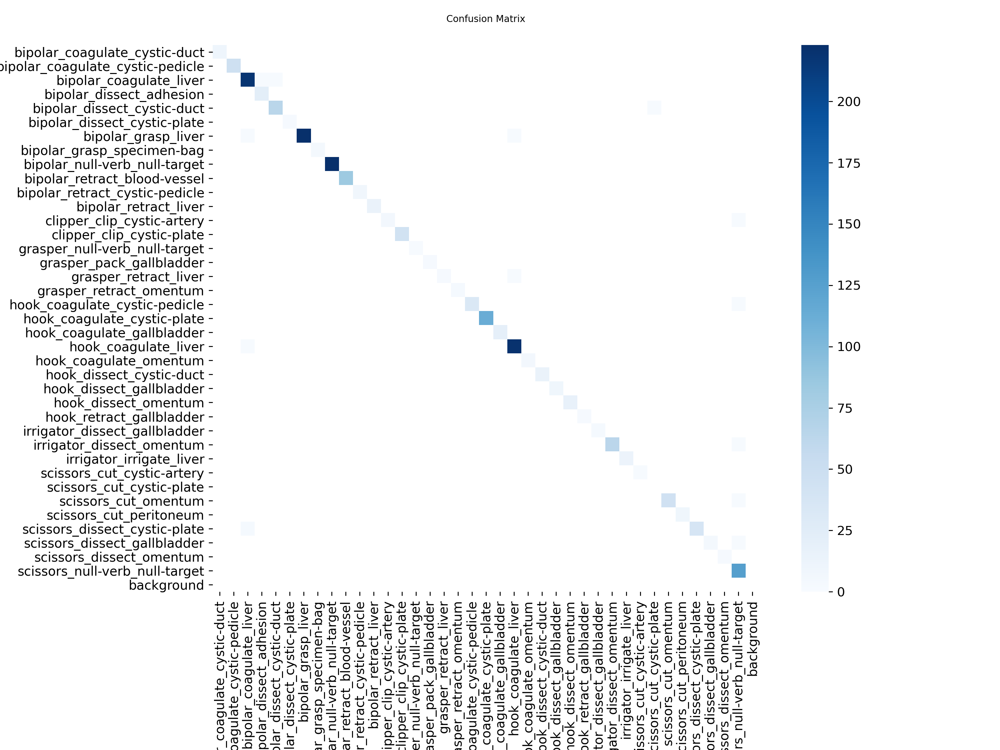

In [ ]:
### Showcase the confusion matrix for the classification model

img = Image.open("runs/classify/train3/confusion_matrix.png")
display(img)

#### 5) Review Scoring/Possible Improvements

In [ ]:
### We will review validation scoring to view any potential overfitting
### and verify top-1 / top-5 accuracy. We also extract fitness, confusion matrix,
### and speed metrics for deeper performance analysis.

### Set model paths
models = {
    "A": "./MODEL/best_model.pt",
    "B": "./MODEL/best_model_2.pt",
    "C": "./MODEL/best_model_3.pt",
}

### Create lists to append metrics
top1_scores = []
top5_scores = []

### Store results in dictionary
all_results = {}

### Perform validation on models
for name, path in models.items():
    print(f"\n Validating Model {name} ({path})...")
    model = YOLO(path)

    results = model.val()     

    ### Extract top-1 and top-5
    top1_scores.append(results.top1)
    top5_scores.append(results.top5)

    ### Save results object for summaries
    all_results[name] = results


### Convert for optional plotting for further information if necessary
model_names = list(models.keys())
top1_scores = np.array(top1_scores)
top5_scores = np.array(top5_scores)

print("\n=== SUMMARY: TOP1 & TOP5 ===")
for i, name in enumerate(model_names):
    print(f"Model {name}: Top1={top1_scores[i]:.4f}, Top5={top5_scores[i]:.4f}")


### Review fitness, speed, and confusion matrix
for name in model_names:
    results = all_results[name]

    print(f"\n\n===== FITNESS, CONFUSION MATRIX, SPEED FOR MODEL {name} =====")

    print("\n--- FITNESS ---")
    print(results.fitness)

    print("\n--- CONFUSION MATRIX ---")
    
    print(results.confusion_matrix)

    print("\n--- SPEED ---")
    print(results.speed)



 Validating Model A (./MODEL/best_model.pt)...
Ultralytics 8.3.213  Python-3.10.18 torch-2.9.1+cpu CPU (Intel Core Ultra 9 275HX)


YOLO11n-cls summary (fused): 47 layers, 1,574,702 parameters, 0 gradients, 3.2 GFLOPs
train: C:\Users\Cake-\Documents\Umich_Personal\Final Fall 2025 Term\ECE579\Project Files\Model_Files\YOLO_dataset\train... found 3331 images in 38 classes  
val: C:\Users\Cake-\Documents\Umich_Personal\Final Fall 2025 Term\ECE579\Project Files\Model_Files\YOLO_dataset\val... found 1724 images in 38 classes  
test: C:\Users\Cake-\Documents\Umich_Personal\Final Fall 2025 Term\ECE579\Project Files\Model_Files\YOLO_dataset\test... found 1732 images in 38 classes  
val: Fast image access  (ping: 0.10.0 ms, read: 3280.71101.6 MB/s, size: 537.6 KB)
val: Scanning C:\Users\Cake-\Documents\Umich_Personal\Final Fall 2025 Term\ECE579\Project Files\Model_Files\YOLO_dataset\val... 1724 images, 0 corrupt: 100% ━━━━━━━━━━━━ 1724/1724 1.7Mit/s 0.0s
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 108/108 3.2it/s 34.1s0.3s
                   all      0.998          1
Speed: 0.0ms preprocess, 8.3ms infere

In [ ]:
### Provide summaries for models

models = {
    "A": "./MODEL/best_model.pt",
    "B": "./MODEL/best_model_2.pt",
    "C": "./MODEL/best_model_3.pt",
}

for name, path in models.items():
    print(f"\n===== SUMMARY FOR MODEL {name} =====")
    model = YOLO(path)
    results = model.val()
    results.summary()   



===== SUMMARY FOR MODEL A =====
Ultralytics 8.3.213  Python-3.10.18 torch-2.9.1+cpu CPU (Intel Core Ultra 9 275HX)
YOLO11n-cls summary (fused): 47 layers, 1,574,702 parameters, 0 gradients, 3.2 GFLOPs
train: C:\Users\Cake-\Documents\Umich_Personal\Final Fall 2025 Term\ECE579\Project Files\Model_Files\YOLO_dataset\train... found 3331 images in 38 classes  
val: C:\Users\Cake-\Documents\Umich_Personal\Final Fall 2025 Term\ECE579\Project Files\Model_Files\YOLO_dataset\val... found 1724 images in 38 classes  
test: C:\Users\Cake-\Documents\Umich_Personal\Final Fall 2025 Term\ECE579\Project Files\Model_Files\YOLO_dataset\test... found 1732 images in 38 classes  
val: Fast image access  (ping: 0.10.0 ms, read: 2178.5639.1 MB/s, size: 537.6 KB)
val: Scanning C:\Users\Cake-\Documents\Umich_Personal\Final Fall 2025 Term\ECE579\Project Files\Model_Files\YOLO_dataset\val... 1724 images, 0 corrupt: 100% ━━━━━━━━━━━━ 1724/1724 1.7Mit/s 0.0s
               classes   top1_acc   top5_acc: 100% ━━━━━━

#### Possible Improvements:
##### Data size, overfitting fixes, more classes utilized, implement new YOLOn12-cls when released. Model seems positive to surpass custom model. Just needs tuning

#### 6) Test Model

In [37]:
### Lets perform testing on model 1

model_new1.predict(save=True, source="./VID31", name="predict")


WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/3946 c:\Users\Cake-\Documents\Umich_Personal\Final Fall 2025 Term\ECE579\Project Files\Model_Files\VID31\000000.png: 512x512 bipolar_retract_blood-vessel 0.66, bipolar_dissect_cystic-duct 0.11, scissors_null-verb_null-target 0.09, bipolar_dissect_adhesion 0.05, bipolar_grasp_liver 0.03, 16.1ms
image 2/3946 c:\Users\Cake-\Documents\Umich_Personal\Final Fall 2025 Term\ECE579\Project Files\Model_Files\VID31\000001.png: 512x512 bipolar_dissect_cystic-

[ultralytics.engine.results.Results object with attributes:
 
 boxes: None
 keypoints: None
 masks: None
 names: {0: 'bipolar_coagulate_cystic-duct', 1: 'bipolar_coagulate_cystic-pedicle', 2: 'bipolar_coagulate_liver', 3: 'bipolar_dissect_adhesion', 4: 'bipolar_dissect_cystic-duct', 5: 'bipolar_dissect_cystic-plate', 6: 'bipolar_grasp_liver', 7: 'bipolar_grasp_specimen-bag', 8: 'bipolar_null-verb_null-target', 9: 'bipolar_retract_blood-vessel', 10: 'bipolar_retract_cystic-pedicle', 11: 'bipolar_retract_liver', 12: 'clipper_clip_cystic-artery', 13: 'clipper_clip_cystic-plate', 14: 'grasper_null-verb_null-target', 15: 'grasper_pack_gallbladder', 16: 'grasper_retract_liver', 17: 'grasper_retract_omentum', 18: 'hook_coagulate_cystic-pedicle', 19: 'hook_coagulate_cystic-plate', 20: 'hook_coagulate_gallbladder', 21: 'hook_coagulate_liver', 22: 'hook_coagulate_omentum', 23: 'hook_dissect_cystic-duct', 24: 'hook_dissect_gallbladder', 25: 'hook_dissect_omentum', 26: 'hook_retract_gallbladder', 

In [38]:
### Lets perform testing on model 2

model_new2.predict(save=True, source="./VID31", name='predict2')


WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/3946 c:\Users\Cake-\Documents\Umich_Personal\Final Fall 2025 Term\ECE579\Project Files\Model_Files\VID31\000000.png: 512x512 bipolar_retract_blood-vessel 0.75, scissors_null-verb_null-target 0.24, bipolar_grasp_liver 0.01, hook_coagulate_cystic-plate 0.00, scissors_cut_omentum 0.00, 16.5ms
image 2/3946 c:\Users\Cake-\Documents\Umich_Personal\Final Fall 2025 Term\ECE579\Project Files\Model_Files\VID31\000001.png: 512x512 scissors_null-verb_null-tar

[ultralytics.engine.results.Results object with attributes:
 
 boxes: None
 keypoints: None
 masks: None
 names: {0: 'bipolar_coagulate_cystic-duct', 1: 'bipolar_coagulate_cystic-pedicle', 2: 'bipolar_coagulate_liver', 3: 'bipolar_dissect_adhesion', 4: 'bipolar_dissect_cystic-duct', 5: 'bipolar_dissect_cystic-plate', 6: 'bipolar_grasp_liver', 7: 'bipolar_grasp_specimen-bag', 8: 'bipolar_null-verb_null-target', 9: 'bipolar_retract_blood-vessel', 10: 'bipolar_retract_cystic-pedicle', 11: 'bipolar_retract_liver', 12: 'clipper_clip_cystic-artery', 13: 'clipper_clip_cystic-plate', 14: 'grasper_null-verb_null-target', 15: 'grasper_pack_gallbladder', 16: 'grasper_retract_liver', 17: 'grasper_retract_omentum', 18: 'hook_coagulate_cystic-pedicle', 19: 'hook_coagulate_cystic-plate', 20: 'hook_coagulate_gallbladder', 21: 'hook_coagulate_liver', 22: 'hook_coagulate_omentum', 23: 'hook_dissect_cystic-duct', 24: 'hook_dissect_gallbladder', 25: 'hook_dissect_omentum', 26: 'hook_retract_gallbladder', 

In [39]:
### Lets perform testing on model 3

model_new3.predict(save=True, source="./VID31", name="predict3")


WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/3946 c:\Users\Cake-\Documents\Umich_Personal\Final Fall 2025 Term\ECE579\Project Files\Model_Files\VID31\000000.png: 640x640 bipolar_null-verb_null-target 0.66, bipolar_retract_blood-vessel 0.11, bipolar_grasp_liver 0.07, bipolar_dissect_cystic-duct 0.06, scissors_cut_omentum 0.04, 20.2ms
image 2/3946 c:\Users\Cake-\Documents\Umich_Personal\Final Fall 2025 Term\ECE579\Project Files\Model_Files\VID31\000001.png: 640x640 bipolar_dissect_cystic-duct 

[ultralytics.engine.results.Results object with attributes:
 
 boxes: None
 keypoints: None
 masks: None
 names: {0: 'bipolar_coagulate_cystic-duct', 1: 'bipolar_coagulate_cystic-pedicle', 2: 'bipolar_coagulate_liver', 3: 'bipolar_dissect_adhesion', 4: 'bipolar_dissect_cystic-duct', 5: 'bipolar_dissect_cystic-plate', 6: 'bipolar_grasp_liver', 7: 'bipolar_grasp_specimen-bag', 8: 'bipolar_null-verb_null-target', 9: 'bipolar_retract_blood-vessel', 10: 'bipolar_retract_cystic-pedicle', 11: 'bipolar_retract_liver', 12: 'clipper_clip_cystic-artery', 13: 'clipper_clip_cystic-plate', 14: 'grasper_null-verb_null-target', 15: 'grasper_pack_gallbladder', 16: 'grasper_retract_liver', 17: 'grasper_retract_omentum', 18: 'hook_coagulate_cystic-pedicle', 19: 'hook_coagulate_cystic-plate', 20: 'hook_coagulate_gallbladder', 21: 'hook_coagulate_liver', 22: 'hook_coagulate_omentum', 23: 'hook_dissect_cystic-duct', 24: 'hook_dissect_gallbladder', 25: 'hook_dissect_omentum', 26: 'hook_retract_gallbladder', 